<a href="https://colab.research.google.com/github/BatoolMM/fastai/blob/master/Chapter_1_2_Your_Deep_Learning_Journey.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Chapter 1. Your Deep Learning Journey**

In [ ]:
!pip install -Uqq fastbook
!pip install fastcore==1.0.9
!pip install utils
from utils import *
import fastbook
fastbook.setup_book()

In [ ]:
!pip install wandb

In [ ]:
from fastbook import *
from fastai.vision.all import *
from fastai.vision.widgets import ImageClassifierCleaner
import wandb
from fastai.callback.wandb import WandbCallback
import matplotlib.pyplot as plt
# !pip install ipywidgets
# import ipywidgets as widgets
# !jupyter nbextension enable --py widgetsnbextension
# !python3 -m pip install --upgrade pip
# !python3 -m pip install --upgrade Pillow

In [ ]:
data = untar_data(URLs.PETS)/'images'

In [ ]:
def is_cat(x):
    return x[0].isupper()

In [ ]:
data_str = ImageDataLoaders.from_name_func(data, 
                                           get_image_files(data),
                                           valid_pct = 0.2, 
                                           seed =42,
                                           label_func = is_cat,
                                           item_tfms = Resize(224))

In [ ]:
model = cnn_learner(data_str, resnet34, metrics=error_rate)
model.fine_tune(1)

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth


epoch,train_loss,valid_loss,error_rate,time
0,0.161170,0.025869,0.008119,00:51


epoch,train_loss,valid_loss,error_rate,time
0,0.057979,0.026976,0.008119,00:55


In [ ]:
image_uploader = widgets.FileUpload()
image_uploader

FileUpload(value={}, description='Upload')

In [ ]:
img = PILImage.create(image_uploader.data[0])

In [ ]:
is_cat, _,prob = model.predict(img)

In [ ]:
print(f"Is this a cat?: {is_cat}.")
print(f"Prob it's a cat: {prob[1].item():6f}")

Is this a cat?: True.
Prob it's a cat: 1.000000


# **The Second Chapter** 

In [ ]:
!pip install azure-cognitiveservices-search-imagesearch
import os
from azure.cognitiveservices.search.imagesearch import ImageSearchClient as api
from msrest.authentication import CognitiveServicesCredentials as auth

In [ ]:
def search_images_bing(key, term, min_sz=128):
    client = api('https://api.cognitive.microsoft.com', auth(key))
    return L(client.images.search(query=term, count=150, min_height=min_sz, min_width=min_sz).value)
key = '8d86a0d22d7643549e560f18abfe8fde'
key2 ="d5851efce83544c6a29b96a7341f28dd"

In [ ]:
key = '8d86a0d22d7643549e560f18abfe8fde'
key2 ="d5851efce83544c6a29b96a7341f28dd"
Schefflera = search_images_bing(key, "Schefflera")
images_Schefflera = Schefflera.attrgot('content_url')


In [ ]:
len(images_Schefflera)

150

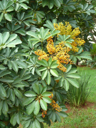

In [ ]:
dest = 'Schefflera.jpg'
download_url(images_Schefflera[0], dest)
img = Image.open(dest)
img.to_thumb(128.128)

In [ ]:
plants_type = 'Dieffenbachia', 'Schefflera', 'Dracaena', 'Epipremnum aureum'
path = Path('plants_new')

In [ ]:
if not path.exists():
    path.mkdir()
    for o in plants_type:
      dest = (path/o)
      dest.mkdir(exist_ok =True)
      results = search_images_bing(key, f'{o} plant')
      download_images(dest, urls = results.attrgot('content_url'))


 Download of https://www.ambius.com/blog/wp-content/uploads/2017/09/ThinkstockPhotos-487585991.jpg has failed after 5 retries
 Fix the download manually:
$ mkdir -p plants_new/Schefflera
$ cd plants_new/Schefflera
$ wget -c https://www.ambius.com/blog/wp-content/uploads/2017/09/ThinkstockPhotos-487585991.jpg
$ tar xf ThinkstockPhotos-487585991.jpg
 And re-run your code once the download is successful



In [ ]:
files = get_image_files(path)
files

(#590) [Path('plants_new/Epipremnum aureum/00000006.jpg'),Path('plants_new/Epipremnum aureum/00000050.jpg'),Path('plants_new/Epipremnum aureum/00000004.jpg'),Path('plants_new/Epipremnum aureum/00000023.jpg'),Path('plants_new/Epipremnum aureum/00000025.jpg'),Path('plants_new/Epipremnum aureum/00000017.jpg'),Path('plants_new/Epipremnum aureum/00000146.JPG'),Path('plants_new/Epipremnum aureum/00000062.jpg'),Path('plants_new/Epipremnum aureum/00000132.jpg'),Path('plants_new/Epipremnum aureum/00000130.jpg')...]

In [ ]:
!ls plants_new

 Dieffenbachia	 Dracaena  'Epipremnum aureum'	 Schefflera


In [ ]:
failed = verify_images(files)
failed


(#9) [Path('plants_new/Schefflera/00000015.jpg'),Path('plants_new/Schefflera/00000024.jpg'),Path('plants_new/Schefflera/00000115.jpg'),Path('plants_new/Schefflera/00000127.jpg'),Path('plants_new/Schefflera/00000111.jpg'),Path('plants_new/Schefflera/00000106.jpg'),Path('plants_new/Dieffenbachia/00000120.jpg'),Path('plants_new/Dracaena/00000089.jpg'),Path('plants_new/Dracaena/00000133.jpg')]

In [ ]:
failed.map(Path.unlink)

(#9) [None,None,None,None,None,None,None,None,None]

In [ ]:
doc(DataBlock)

In [ ]:
data = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.1, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))


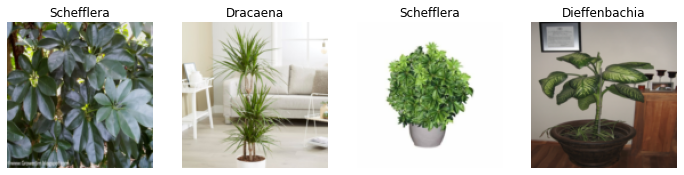

In [ ]:
dls = data.dataloaders(path)
dls.valid.show_batch(max_n =4, nrows=1)

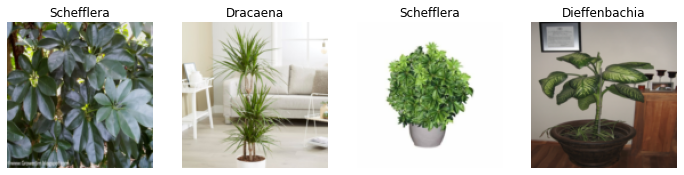

In [ ]:
data = data.new(item_tfms=Resize(128, ResizeMethod.Squish))
dls = data.dataloaders(path)
dls.valid.show_batch(max_n=4,nrows=1)

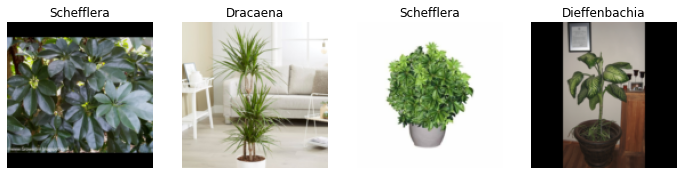

In [ ]:
data = data.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))
dls = data.dataloaders(path)
dls.valid.show_batch(max_n=4,nrows=1)

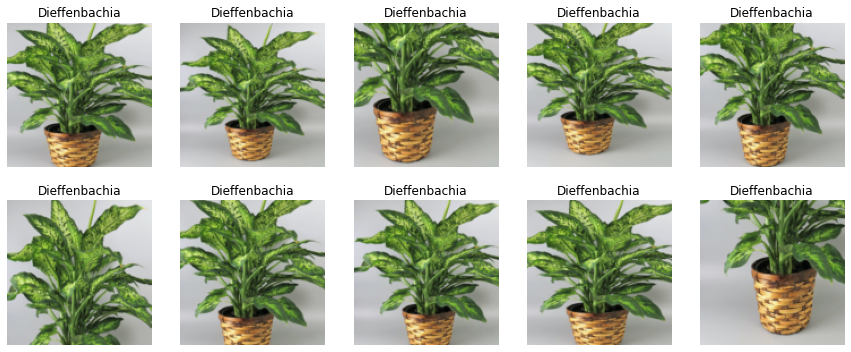

In [ ]:
data = data.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = data.dataloaders(path)
dls.train.show_batch(max_n=10, nrows=2, unique=True)

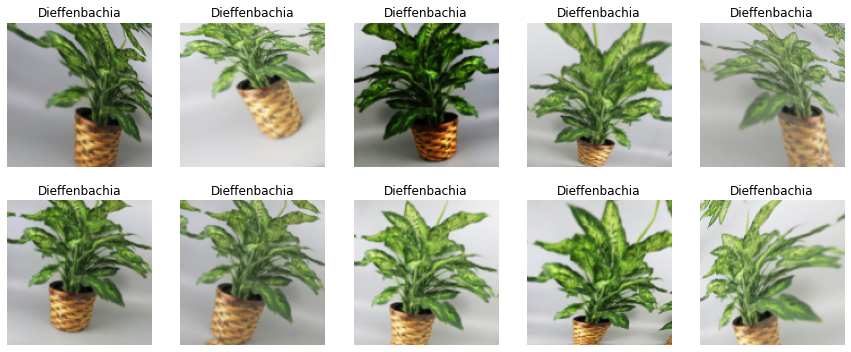

In [ ]:
data = data.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = data.dataloaders(path)
dls.train.show_batch(max_n=10, nrows=2, unique=True)

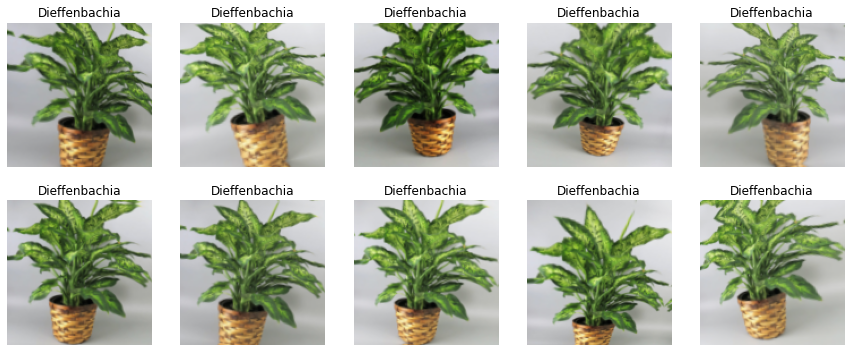

In [ ]:
data = data.new(item_tfms=Resize(128), batch_tfms=aug_transforms())
dls = data.dataloaders(path)
dls.train.show_batch(max_n=10, nrows=2, unique=True)

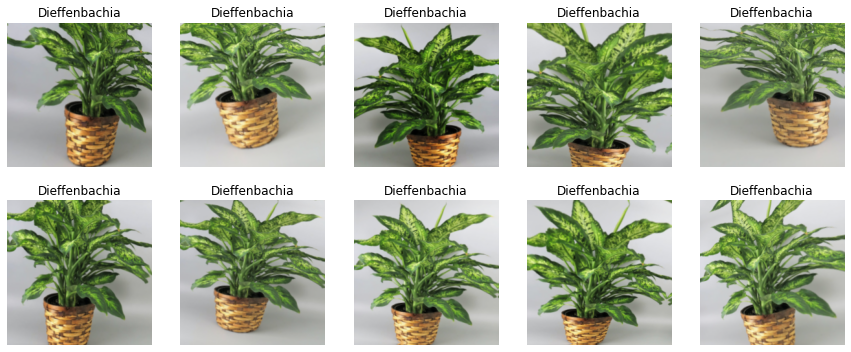

In [ ]:
data = data.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = data.dataloaders(path)
dls.train.show_batch(max_n=10, nrows=2, unique=True)

In [ ]:
data = data.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())

dls = data.dataloaders(path)
learn = cnn_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(5)


Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth


epoch,train_loss,valid_loss,error_rate,time
0,1.876347,0.868393,0.362069,00:18


epoch,train_loss,valid_loss,error_rate,time
0,0.748370,0.276925,0.155172,00:18
1,0.552864,0.189489,0.103448,00:18
2,0.426426,0.147593,0.034483,00:18
3,0.332517,0.168603,0.034483,00:18
4,0.269894,0.167208,0.034483,00:18


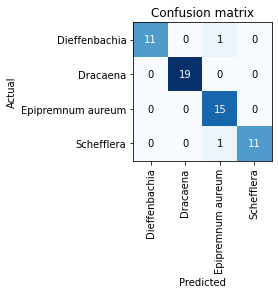

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

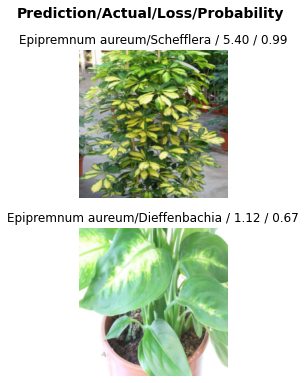

In [ ]:
interp.plot_top_losses(2, nrows=2)

In [ ]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [ ]:
for idx in cleaner.delete():
  cleaner.fns[idx].unlink()

In [ ]:
dls = data.dataloaders(path)
learn = cnn_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(7)


epoch,train_loss,valid_loss,error_rate,time
0,1.800613,0.795864,0.310345,00:18


epoch,train_loss,valid_loss,error_rate,time
0,0.720255,0.325125,0.103448,00:18
1,0.609749,0.140532,0.051724,00:18
2,0.476691,0.119241,0.051724,00:18
3,0.357984,0.098658,0.034483,00:18
4,0.302711,0.083774,0.034483,00:18
5,0.252749,0.089927,0.034483,00:18
6,0.214264,0.091950,0.034483,00:18


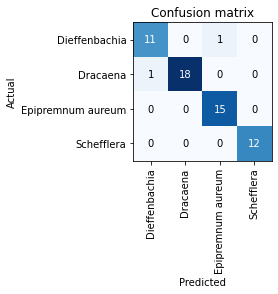

In [ ]:
interpret = ClassificationInterpretation.from_learner(learn)
interpret.plot_confusion_matrix()

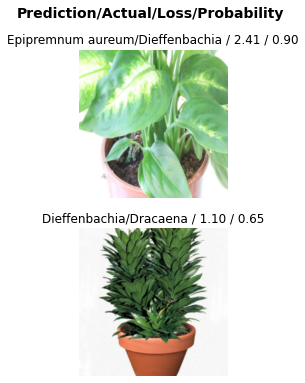

In [ ]:
interpret.plot_top_losses(2,nrows=2)


In [ ]:
learn.export()

In [ ]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [ ]:
learner_inf = load_learner('export.pkl')

In [ ]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [ ]:
learner_inf.dls.vocab

(#4) ['Dieffenbachia','Dracaena','Epipremnum aureum','Schefflera']

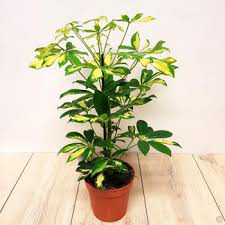

In [ ]:
img = PILImage.create(btn_upload.data[-1])
img


In [ ]:
pred,pred_idx,probs = learner_inf.predict(img)
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: Schefflera; Probability: 0.9998')

**Chapter 6: Other Computer vision problems**

In [ ]:
wandb.init(project='chapt_6_fastai')

wandb: WARNING Calling wandb.login() after wandb.init() has no effect.


In [ ]:
path = untar_data(URLs.PASCAL_2007)

In [ ]:
path.ls()

(#8) [Path('/root/.fastai/data/pascal_2007/test.csv'),Path('/root/.fastai/data/pascal_2007/train.json'),Path('/root/.fastai/data/pascal_2007/segmentation'),Path('/root/.fastai/data/pascal_2007/train.csv'),Path('/root/.fastai/data/pascal_2007/valid.json'),Path('/root/.fastai/data/pascal_2007/test.json'),Path('/root/.fastai/data/pascal_2007/test'),Path('/root/.fastai/data/pascal_2007/train')]

In [ ]:
df = pd.read_csv(path/'train.csv')
df.head(2)

,fname,labels,is_valid
0,000005.jpg,chair,True
1,000007.jpg,car,True


In [ ]:
dblock = DataBlock()

In [ ]:
dsets = dblock.datasets(df)

In [ ]:
dsets.train[0]

(fname       008663.jpg
 labels      car person
 is_valid         False
 Name: 4346, dtype: object, fname       008663.jpg
 labels      car person
 is_valid         False
 Name: 4346, dtype: object)

In [ ]:
dblock = DataBlock(get_x=lambda r: r['fname'], get_y=lambda r: r['labels'])
dsets = dblock.datasets(df)
dsets.train[0]

('005620.jpg', 'aeroplane')

In [ ]:
def get_x(r):
  return path/'train'/r['fname']

def get_y(r):
  return r['labels'].split(' ')

dblock = DataBlock(
    get_x = get_x,
    get_y = get_y
)

dsets = dblock.datasets(df)
dsets.train[3]

(Path('/root/.fastai/data/pascal_2007/train/006135.jpg'), ['train'])

In [ ]:
#To actually open the image and do the conversion to tensors, we willneed to use a set of transforms; 
#block types will provide us with those.

dblock = DataBlock(blocks=(ImageBlock, MultiCategoryBlock),
                   get_x = get_x,
                   get_y = get_y)
dsets = dblock.datasets(df)
dsets.train[0]

(PILImage mode=RGB size=500x325,
 TensorMultiCategory([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.]))

In [ ]:
# index = torch.where(dsets.train)
dsets.train[0]

(PILImage mode=RGB size=500x325,
 TensorMultiCategory([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.]))

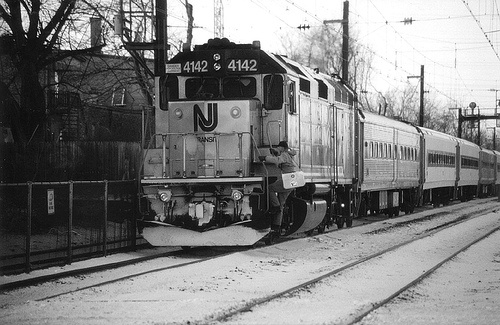

In [ ]:
dsets.train[0][0]

In [ ]:
dsets.train[0][1]

TensorMultiCategory([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.])

In [ ]:
dsets.train[0][1]==1.

TensorMultiCategory([False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False,  True, False])

In [ ]:
indx = torch.where(dsets.train[0][1]==1.)
indx

(tensor([18]),)

In [ ]:
indx = torch.where(dsets.train[0][1]==1.)[0]
indx

tensor([18])

In [ ]:
dsets.train.vocab[indx]

(#1) ['train']

In [ ]:
dsets.train

(#4009) [(PILImage mode=RGB size=500x325, TensorMultiCategory([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.])),(PILImage mode=RGB size=500x331, TensorMultiCategory([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0., 0., 0., 0.])),(PILImage mode=RGB size=500x323, TensorMultiCategory([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.])),(PILImage mode=RGB size=500x375, TensorMultiCategory([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 0., 0.])),(PILImage mode=RGB size=500x375, TensorMultiCategory([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 0., 1.])),(PILImage mode=RGB size=500x375, TensorMultiCategory([0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])),(PILImage mode=RGB size=333x500, TensorMultiCategory([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.])),(PILImage mode=RGB size=375x500, Tensor

In [ ]:
df['is_valid']

0        True
1        True
2        True
3       False
4        True
        ...  
5006     True
5007     True
5008     True
5009    False
5010    False
Name: is_valid, Length: 5011, dtype: bool

In [ ]:
df['is_valid'].tolist()[0:3]

[True, True, True]

In [ ]:
df.index[df['is_valid']].tolist()[0:4]

[0, 1, 2, 4]

In [ ]:
def splitter(df):
  train = df.index[~df['is_valid']].tolist()
  valid = df.index[df['is_valid']].tolist()
  return train, valid

dblock = DataBlock(blocks=(ImageBlock, MultiCategoryBlock),
                   splitter = splitter,
                   get_x = get_x,
                   get_y = get_y)
dsets = dblock.datasets(df)
dsets.train[0]


(PILImage mode=RGB size=500x333,
 TensorMultiCategory([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]))

In [ ]:
dblock = DataBlock(blocks=(ImageBlock, MultiCategoryBlock), 
                   get_x = get_x,
                   get_y = get_y,
                   splitter = splitter,
                   item_tfms = RandomResizedCrop(128, min_scale=0.35))
dls = dblock.dataloaders(df)

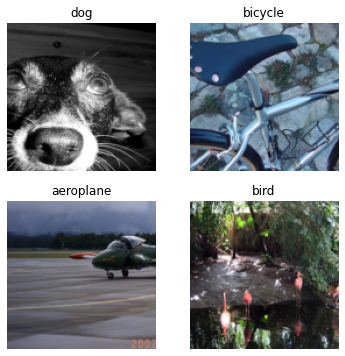

In [ ]:
dls.show_batch(max_n=4)

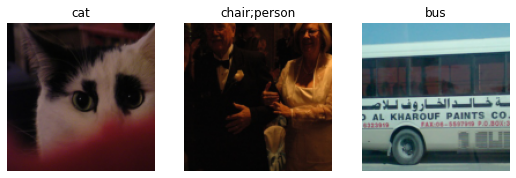

In [ ]:
dls.show_batch(nrows=1, ncols=3)

In [ ]:
learn = cnn_learner(dls, resnet18)

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth


In [ ]:
x,y = to_cpu(dls.train.one_batch())
activs = learn.model(x)
activs.shape

torch.Size([64, 20])

In [ ]:
activs[0]

tensor([ 1.9065, -0.6531, -0.0964,  4.1295, -0.1311, -0.9944, -3.1610,  0.8718, -1.4275, -2.0171,  3.4832,  1.1581,  2.3130, -0.2172, -3.3563,  0.3696,  1.7599, -2.1252,  0.9373,  1.6697],
       grad_fn=<SelectBackward>)

In [ ]:
def binary_cross_entropy(inputs, target):
  inputs = inputs.sigmoid()
  return -torch.where(target==1, inputs, 1-inputs).log.mean()

In [ ]:
loss_func = nn.BCEWithLogitsLoss()
loss = loss_func(activs, y)
loss

tensor(1.0479, grad_fn=<BinaryCrossEntropyWithLogitsBackward>)

In [ ]:
def accuracy_multi(inpu, targ, thresh=0.5, sigmoid=True):
  if sigmoid:
    inpu = inpu.sigmoid()
  return ((inpu>thresh)==targ.bool()).float().mean()

In [ ]:
learn = cnn_learner(dls, resnet50, metrics=partial(accuracy_multi, thresh=0.2))
learn.fine_tune(3, base_lr=3e-3, freeze_epochs=4)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


epoch,train_loss,valid_loss,accuracy_multi,time
0,0.940110,0.700048,0.234024,00:29
1,0.823429,0.559887,0.292928,00:29
2,0.601471,0.205724,0.809064,00:29
3,0.359259,0.124766,0.939223,00:30


epoch,train_loss,valid_loss,accuracy_multi,time
0,0.134206,0.115597,0.949861,00:30
1,0.117566,0.108279,0.949861,00:29
2,0.097548,0.105226,0.950936,00:29


In [ ]:
learn.metrics = partial(accuracy_multi, thresh=0.1)
learn.validate()

(#2) [0.10522647202014923,0.930517852306366]

In [ ]:
learn.metrics = partial(accuracy_multi, thresh=0.9)
learn.validate()

(#2) [0.10522647202014923,0.9565737247467041]

In [ ]:
 a = learn.get_preds()
 a

(tensor([[1.9085e-03, 7.7619e-03, 1.5013e-03,  ..., 5.4344e-01, 2.0177e-03, 2.7145e-01],
         [1.9841e-04, 5.4519e-03, 3.3637e-03,  ..., 6.3131e-03, 9.2812e-04, 2.6103e-04],
         [3.3934e-03, 4.8681e-02, 2.7375e-03,  ..., 5.6607e-03, 1.0235e-03, 4.5490e-03],
         ...,
         [4.4247e-03, 1.2570e-03, 5.8002e-04,  ..., 1.0870e-02, 2.8198e-03, 1.6447e-02],
         [2.4171e-02, 4.3548e-03, 1.5116e-02,  ..., 6.6151e-03, 2.9825e-03, 1.9265e-03],
         [7.9775e-04, 8.7386e-01, 6.6757e-04,  ..., 6.8081e-03, 6.8211e-04, 6.8509e-03]]),
 tensor([[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 1., 0.,  ..., 0., 0., 0.]]))

In [ ]:
# reformate: get_preds applies the output activation function (sigmoid, in thiscase) for us, 
# so we’ll need to tell accuracy_multi to notapply it
preds, targs = learn.get_preds()
accuracy_multi(preds, targs, thresh=0.9, sigmoid=False)


tensor(0.9566)

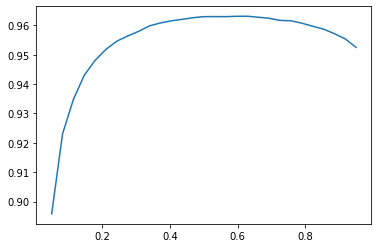

In [ ]:
x_axis = torch.linspace(0.05,0.95,29)
y_axis = [accuracy_multi(preds, targs, thresh= i, sigmoid=False) for i in x_axis]
plt.plot(x_axis, y_axis)

In [ ]:
path = untar_data(URLs.BIWI_HEAD_POSE)
path.ls()

(#50) [Path('/root/.fastai/data/biwi_head_pose/03.obj'),Path('/root/.fastai/data/biwi_head_pose/20.obj'),Path('/root/.fastai/data/biwi_head_pose/11'),Path('/root/.fastai/data/biwi_head_pose/23'),Path('/root/.fastai/data/biwi_head_pose/15'),Path('/root/.fastai/data/biwi_head_pose/01'),Path('/root/.fastai/data/biwi_head_pose/10.obj'),Path('/root/.fastai/data/biwi_head_pose/07.obj'),Path('/root/.fastai/data/biwi_head_pose/06'),Path('/root/.fastai/data/biwi_head_pose/04')...]

In [ ]:
len(path.ls())

50

In [ ]:
(path/'01').ls()[:3]

(#3) [Path('/root/.fastai/data/biwi_head_pose/01/frame_00038_pose.txt'),Path('/root/.fastai/data/biwi_head_pose/01/frame_00248_rgb.jpg'),Path('/root/.fastai/data/biwi_head_pose/01/frame_00140_rgb.jpg')]

In [ ]:
# collect only the images in the path
img_files = get_image_files(path)
img_files

# convert these images to pose
#'frame_00248_rgb.jpg' to 'frame_00038_pose.txt'

def img2pose(x):
  return Path(f'{str(x)[:-7]}pose.txt')

In [ ]:
img2pose(img_files[0])

Path('/root/.fastai/data/biwi_head_pose/11/frame_00248_pose.txt')

In [ ]:
img_files[:5]

(#5) [Path('/root/.fastai/data/biwi_head_pose/11/frame_00248_rgb.jpg'),Path('/root/.fastai/data/biwi_head_pose/11/frame_00140_rgb.jpg'),Path('/root/.fastai/data/biwi_head_pose/11/frame_00514_rgb.jpg'),Path('/root/.fastai/data/biwi_head_pose/11/frame_00003_rgb.jpg'),Path('/root/.fastai/data/biwi_head_pose/11/frame_00326_rgb.jpg')]

In [ ]:
im = PILImage.create(img_files[0])
im.shape

(480, 640)

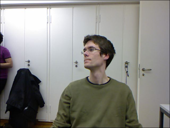

In [ ]:
im.to_thumb(170)

In [ ]:
cal = np.genfromtxt(path/'01'/'rgb.cal', skip_footer=6)
cal

array([[517.679,   0.   , 320.   ],
       [  0.   , 517.679, 240.5  ],
       [  0.   ,   0.   ,   1.   ]])

In [ ]:
?np.genfromtxt

In [ ]:
def get_ctr(f):
    ctr = np.genfromtxt(img2pose(f), skip_header=3)
    c1 = ctr[0] * cal[0][0]/ctr[2] + cal[0][2]
    c2 = ctr[1] * cal[1][1]/ctr[2] + cal[1][2]
    return tensor([c1,c2])

In [ ]:
get_ctr(img_files[0])

tensor([347.8513, 201.2047])

In [ ]:
biwi = DataBlock(
    blocks=(ImageBlock, PointBlock),
    get_items=get_image_files,
    get_y=get_ctr,
    splitter=FuncSplitter(lambda x: x.parent.name=='13'),
    batch_tfms=[*aug_transforms(size=(240,320)),
                  Normalize.from_stats(*imagenet_stats)]
                 )


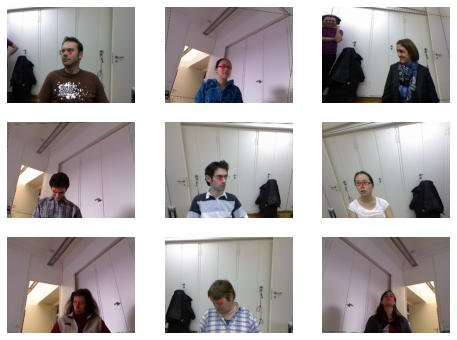

In [ ]:
dls = biwi.dataloaders(path)
dls.show_batch(max_n=9, figsize=(8,6))

In [ ]:
xb, yb = dls.one_batch()
xb.shape, yb.shape

(torch.Size([64, 3, 240, 320]), torch.Size([64, 1, 2]))

In [ ]:
xb[0]

tensor([[[ 0.3876,  0.4048,  0.4048,  ...,  0.5129,  0.5129,  0.5129],
         [ 0.3928,  0.4048,  0.4048,  ...,  0.5129,  0.5129,  0.5129],
         [ 0.4005,  0.4116,  0.4144,  ...,  0.5129,  0.5129,  0.5129],
         ...,
         [-0.8759,  0.3424,  0.2988,  ...,  1.4913,  1.4454,  1.4251],
         [-1.3270,  0.3231,  0.2817,  ...,  1.5080,  1.4851,  1.4361],
         [-1.8662,  0.2478,  0.2185,  ...,  1.5090,  1.4909,  1.4412]],

        [[ 0.4282,  0.4180,  0.4180,  ...,  0.5710,  0.5710,  0.5710],
         [ 0.4336,  0.4180,  0.4180,  ...,  0.5710,  0.5710,  0.5710],
         [ 0.4415,  0.4254,  0.4279,  ...,  0.5710,  0.5710,  0.5710],
         ...,
         [-0.8512,  0.4096,  0.3648,  ...,  1.5635,  1.5176,  1.4816],
         [-1.3403,  0.3898,  0.3472,  ...,  1.5801,  1.5573,  1.5010],
         [-1.9248,  0.3123,  0.2821,  ...,  1.5811,  1.5631,  1.5134]],

        [[ 0.5646,  0.5684,  0.5684,  ...,  0.7907,  0.7907,  0.7907],
         [ 0.5700,  0.5684,  0.5684,  ...,  0

In [ ]:
yb[0]

tensor([[-0.1633,  0.0372]], device='cuda:0')

In [ ]:
learn = cnn_learner(dls, resnet18, y_range=(-1,1))

In [ ]:
def sigmoid_range(x,lo,hi):
  return torch.sigmoid(x)*(hi-lo) +lo

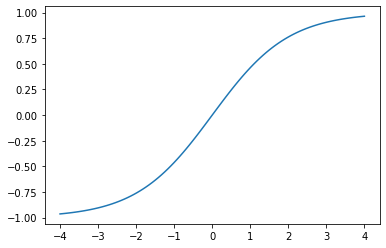

In [ ]:
plot_function(partial(sigmoid_range, lo =-1, hi=1), min=-4, max=4)

In [ ]:
dls.loss_func

FlattenedLoss of MSELoss()

SuggestedLRs(lr_min=0.005754399299621582, lr_steep=1.3182567499825382e-06)

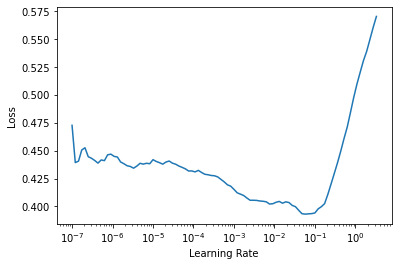

In [ ]:
learn.lr_find()

In [ ]:
lr = 2e-2
learn.fit_one_cycle(5, lr, cbs=WandbCallback())

WandbCallback requires use of "SaveModelCallback" to log best model


epoch,train_loss,valid_loss,time
0,0.045776,0.027140,02:22
1,0.007212,0.000527,02:21
2,0.002789,0.000336,02:22
3,0.001946,0.000547,02:23
4,0.001573,0.000133,02:25


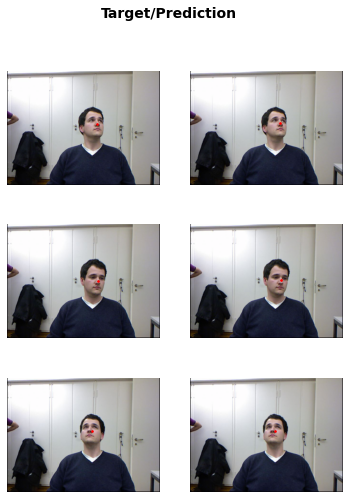

In [ ]:
learn.show_results(ds_idx=1, nrows=3, figsize=(6,8))